<p style = "font-size : 42px; color : #393e46 ; font-family : 'Comic Sans MS'; text-align : center; background-color : #00adb5; border-radius: 5px 5px;"><strong>Hotel Booking Cancellation EDA </strong></p>

In [1]:
# %pip install folium

In [1]:
# importing libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

import warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report


import folium
from folium.plugins import HeatMap
import plotly.express as px

plt.style.use('fivethirtyeight')
%matplotlib inline
pd.set_option('display.max_columns', 32)

In [3]:
#  "D:\RNW\14_portfolio\machine_learning\hotel_booking_cancellation_prediction_model\hotel_bookings.csv"

In [4]:
# reading data 
df = pd.read_csv(r"D:\RNW\14_portfolio\machine_learning\hotel_booking_cancellation_prediction_model\hotel_bookings.csv")
df.head()


,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [5]:
df.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119386.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,103050.000000,6797.000000,119390.000000,119390.000000,119390.000000,119390.000000
mean,0.370416,104.011416,2016.156554,27.165173,15.798241,0.927599,2.500302,1.856403,0.103890,0.007949,0.031912,0.087118,0.137097,0.221124,86.693382,189.266735,2.321149,101.831122,0.062518,0.571363
std,0.482918,106.863097,0.707476,13.605138,8.780829,0.998613,1.908286,0.579261,0.398561,0.097436,0.175767,0.844336,1.497437,0.652306,110.774548,131.655015,17.594721,50.535790,0.245291,0.792798
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,-6.380000,0.000000,0.000000
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,62.000000,0.000000,69.290000,0.000000,0.000000
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,179.000000,0.000000,94.575000,0.000000,0.000000
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,229.000000,270.000000,0.000000,126.000000,0.000000,1.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,21.000000,535.000000,543.000000,391.000000,5400.000000,8.000000,5.000000


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [7]:
# checking for null values 

null = pd.DataFrame({'Null Values' : df.isna().sum(), 'Percentage Null Values' : (df.isna().sum()) / (df.shape[0]) * (100)})
null

,Null Values,Percentage Null Values
hotel,0,0.000000
is_canceled,0,0.000000
lead_time,0,0.000000
arrival_date_year,0,0.000000
arrival_date_month,0,0.000000
arrival_date_week_number,0,0.000000
arrival_date_day_of_month,0,0.000000
stays_in_weekend_nights,0,0.000000
stays_in_week_nights,0,0.000000
adults,0,0.000000


In [8]:
# filling null values with zero

df.fillna(0, inplace = True)

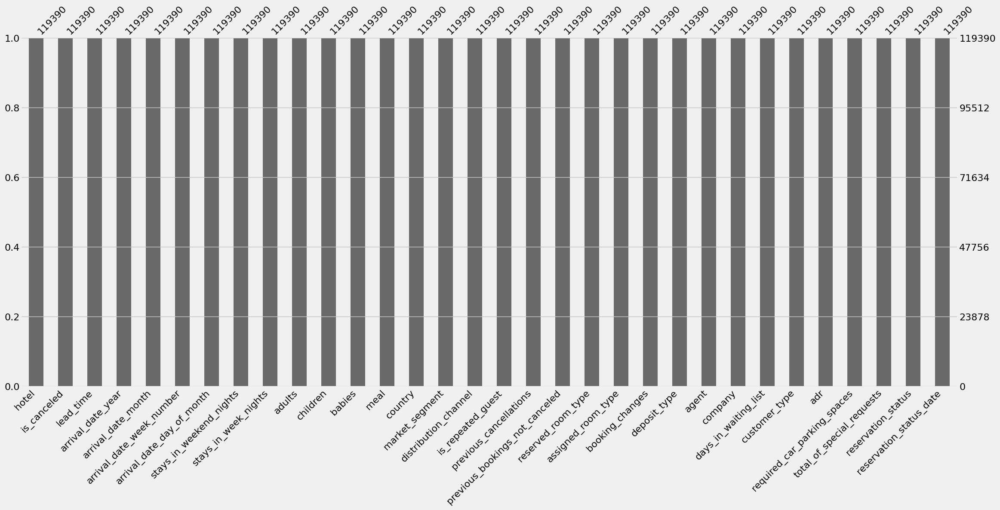

In [9]:
# visualizing null values
msno.bar(df)
plt.show()

In [10]:
# adults, babies and children cant be zero at same time, so dropping the rows having all these zero at same time

filter = (df.children == 0) & (df.adults == 0) & (df.babies == 0)
df[filter]

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
2224,Resort Hotel,0,1,2015,October,41,6,0,3,0,0.0,0,SC,PRT,Corporate,Corporate,0,0,0,A,I,1,No Deposit,0.0,174.0,0,Transient-Party,0.00,0,0,Check-Out,2015-10-06
2409,Resort Hotel,0,0,2015,October,42,12,0,0,0,0.0,0,SC,PRT,Corporate,Corporate,0,0,0,A,I,0,No Deposit,0.0,174.0,0,Transient,0.00,0,0,Check-Out,2015-10-12
3181,Resort Hotel,0,36,2015,November,47,20,1,2,0,0.0,0,SC,ESP,Groups,TA/TO,0,0,0,A,C,0,No Deposit,38.0,0.0,0,Transient-Party,0.00,0,0,Check-Out,2015-11-23
3684,Resort Hotel,0,165,2015,December,53,30,1,4,0,0.0,0,SC,PRT,Groups,TA/TO,0,0,0,A,A,1,No Deposit,308.0,0.0,122,Transient-Party,0.00,0,0,Check-Out,2016-01-04
3708,Resort Hotel,0,165,2015,December,53,30,2,4,0,0.0,0,SC,PRT,Groups,TA/TO,0,0,0,A,C,1,No Deposit,308.0,0.0,122,Transient-Party,0.00,0,0,Check-Out,2016-01-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115029,City Hotel,0,107,2017,June,26,27,0,3,0,0.0,0,BB,CHE,Online TA,TA/TO,0,0,0,A,A,1,No Deposit,7.0,0.0,0,Transient,100.80,0,0,Check-Out,2017-06-30
115091,City Hotel,0,1,2017,June,26,30,0,1,0,0.0,0,SC,PRT,Complementary,Direct,0,0,0,E,K,0,No Deposit,0.0,0.0,0,Transient,0.00,1,1,Check-Out,2017-07-01
116251,City Hotel,0,44,2017,July,28,15,1,1,0,0.0,0,SC,SWE,Online TA,TA/TO,0,0,0,A,K,2,No Deposit,425.0,0.0,0,Transient,73.80,0,0,Check-Out,2017-07-17
116534,City Hotel,0,2,2017,July,28,15,2,5,0,0.0,0,SC,RUS,Online TA,TA/TO,0,0,0,A,K,1,No Deposit,9.0,0.0,0,Transient-Party,22.86,0,1,Check-Out,2017-07-22


In [11]:
df = df[~filter]
df

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,0.0,0.0,0,Transient,0.00,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,0.0,0.0,0,Transient,0.00,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,0.0,0.0,0,Transient,75.00,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,0.0,0,Transient,75.00,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0.0,0,Transient,98.00,0,1,Check-Out,2015-07-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5,2,0.0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,0.0,0,Transient,96.14,0,0,Check-Out,2017-09-06
119386,City Hotel,0,102,2017,August,35,31,2,5,3,0.0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,0.0,0,Transient,225.43,0,2,Check-Out,2017-09-07
119387,City Hotel,0,34,2017,August,35,31,2,5,2,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,0.0,0,Transient,157.71,0,4,Check-Out,2017-09-07
119388,City Hotel,0,109,2017,August,35,31,2,5,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,0.0,0,Transient,104.40,0,0,Check-Out,2017-09-07


In [13]:
from ydata_profiling import ProfileReport

# Assuming your dataset is 'hmp'
profile = ProfileReport(df, title="Hotel Booking Data Report", explorative=True)

# To display inside Jupyter Notebook:
profile.to_notebook_iframe()

# Or to save it as an HTML file:
# profile.to_file("hotel_booking_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 32/32 [00:00<00:00, 124.43it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<a id = '2.0'></a>
<p style = "font-size : 40px; color : #34656d ; font-family : 'Comic Sans MS'; text-align : center; background-color : #f9b208; border-radius: 5px 5px;"><strong>Exploratory Data Analysis (EDA)</strong></p> 

In [14]:
# setting the background
sns.set_style("ticks")
# setting the color pallette
sns.set_palette(sns.color_palette("rainbow"))
# changing the default context
sns.set_context('talk')

### **Q. What is the percentage of booking in each hotel?**

Since, there are two types of hotels - Resort and City hotel which is evident from the series depicting unique values of each column, we can use a *pie chart* or a *bar plot* to display the data.

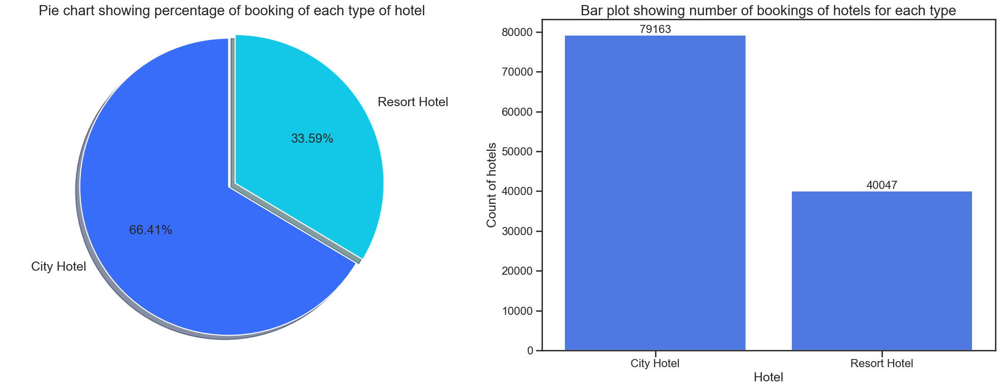

In [15]:
# Create the figure and axes
fig, ax = plt.subplots(1, 2, figsize=(20, 8))

# Plotting the pie chart
data = np.array(df['hotel'].value_counts().to_list())                           
labels = np.array(df['hotel'].value_counts().index.to_list())                                                                                                                  
ax[0].pie(data, labels=labels, autopct='%0.2f%%', explode=[0, 0.05], startangle=90, 
          textprops={'fontsize': 18}, shadow=True)
ax[0].axis('equal')
ax[0].set_title('Pie chart showing percentage of booking of each type of hotel', fontsize=20)

# Plotting the bar plot - FIXED THIS PART
data_bar = df['hotel'].value_counts().reset_index()
data_bar.columns = ['hotel', 'count']  # Properly rename columns

sns.barplot(data=data_bar, x='hotel', y='count', ax=ax[1])
ax[1].set_title('Bar plot showing number of bookings of hotels for each type', fontsize=20)
ax[1].bar_label(ax[1].containers[0], fontsize=16)
ax[1].tick_params(axis="both", labelsize=16)
ax[1].set_xlabel('Hotel', fontsize=18)
ax[1].set_ylabel('Count of hotels', fontsize=18)

plt.tight_layout()
plt.show()



*   People prefer City hostels over Resort hotels as they might be cheaper as compared to the later ones.
*   Number of bookings for City Hotel is almost 1.57 times more than that of Resort Hotel.



Let us have a look at the booking statistics for each hotel throughout the timeline **2015-2017**

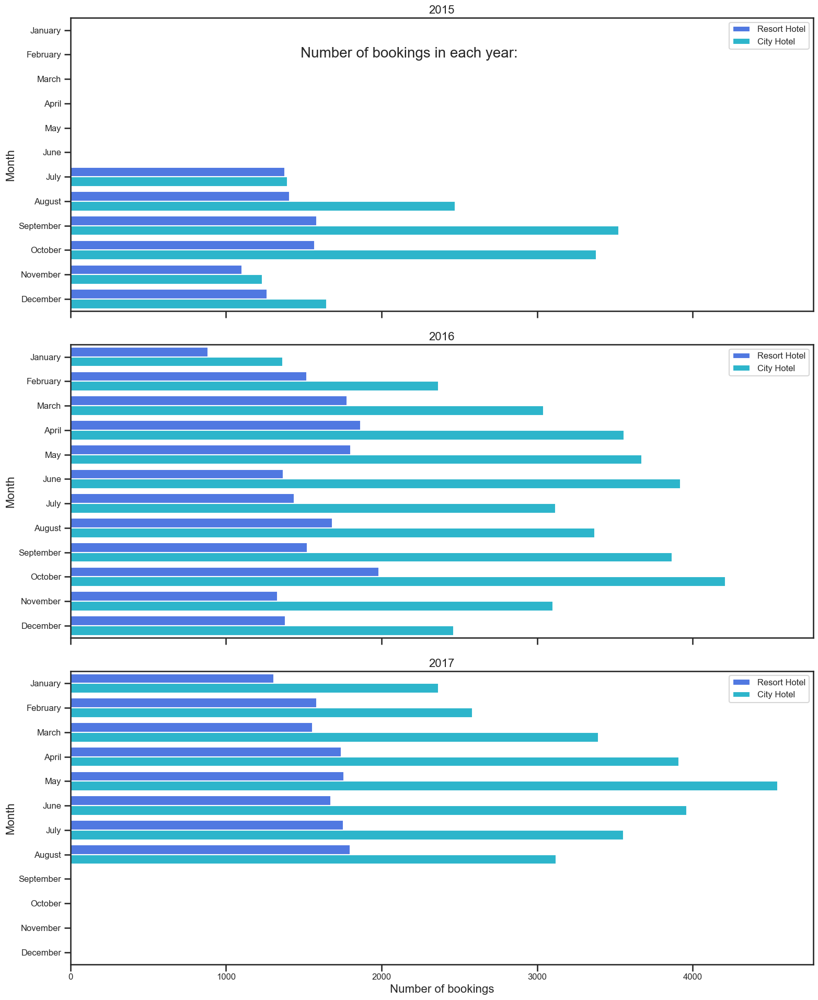

In [16]:

# Filter data by year
data_2015 = df[df["arrival_date_year"] == 2015]
data_2016 = df[df["arrival_date_year"] == 2016]
data_2017 = df[df["arrival_date_year"] == 2017]

# Month order for consistent sorting
ordered_month = ['January', 'February', 'March', 'April', 'May', 'June', 
                 'July', 'August', 'September', 'October', 'November', 'December']

# Create figure with 3 subplots
fig, ax = plt.subplots(3, 1, sharex=True, figsize=(16, 20))
data = [data_2015, data_2016, data_2017]
years = [2015, 2016, 2017]

# Plot each year's data
for i, year_data in enumerate(data):
    ax[i].set_title(f'{years[i]}', fontsize=16)
    sns.countplot(data=year_data, y="arrival_date_month", hue="hotel", 
                 order=ordered_month, ax=ax[i])
    ax[i].set_ylabel('Month', fontsize=16)
    ax[i].set_xlabel('Number of bookings', fontsize=16)
    ax[i].tick_params(labelsize=12)  # Adjust tick label size
    ax[i].legend(fontsize=12)  # Adjust legend font size

plt.suptitle("Number of bookings in each year:", fontsize=20, y=0.92)
plt.tight_layout()
plt.show()


The dataset contains data from **July, 2015** to **August, 2017**. Hence, we have 3 years of data for **July** and **August**, while for all other months the dataset contains data for only 2 years. Maximum number of bookings for the Resort hotel was reported in **Aug, 2017** while that of for the City hotel was reported in **May, 2017**.

### **Q. How many bookings were canceled?**

We can split the data into two seperate dataframes containing information of each hotel to ease our analysis.

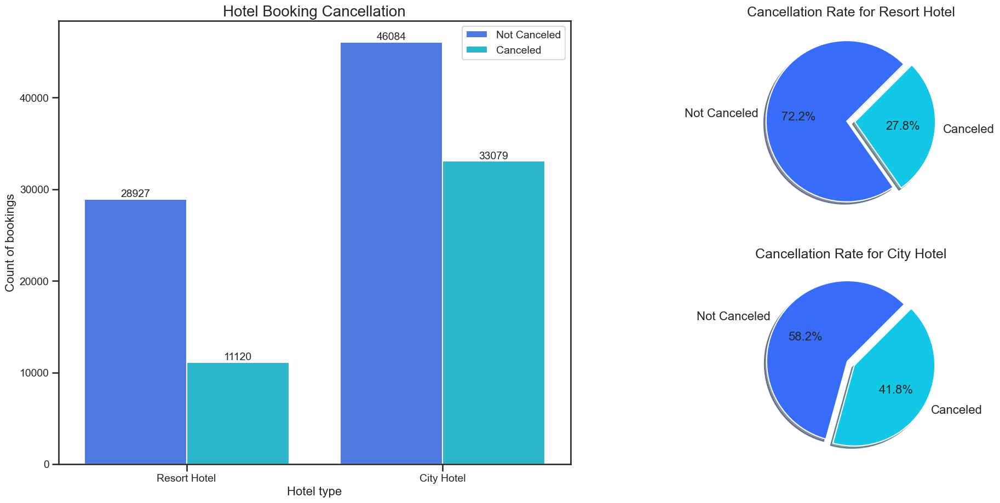

In [17]:

# Filter data by hotel type
resort_ht = df[df['hotel'] == 'Resort Hotel']
city_ht = df[df['hotel'] == 'City Hotel']

# Create figure with custom grid layout
fig = plt.figure(figsize=(22, 10))
grid = plt.GridSpec(2, 4, hspace=0.2, wspace=0.1)
ax1 = fig.add_subplot(grid[0:, :2])  # Left side - full height
ax2 = fig.add_subplot(grid[0, 2:])   # Top right
ax3 = fig.add_subplot(grid[1, 2:])   # Bottom right

# Countplot showing booking cancellation by hotel type
sns.countplot(x="hotel", data=df, hue="is_canceled", ax=ax1)
ax1.set_title('Hotel Booking Cancellation', fontsize=20)
ax1.set_xlabel('Hotel type', fontsize=16)
ax1.set_ylabel('Count of bookings', fontsize=16)
ax1.tick_params(axis='both', labelsize=14)

# Add count labels to bars
for container in ax1.containers:
    ax1.bar_label(container, fontsize=14)

ax1.legend(['Not Canceled', 'Canceled'], loc='upper right', fontsize=14)

# Pie charts showing cancellation rates for each hotel type
resort_data = resort_ht['is_canceled'].value_counts(normalize=True)
city_data = city_ht['is_canceled'].value_counts(normalize=True)

titles = ['Resort Hotel', 'City Hotel']
data = [resort_data, city_data]
labels = ['Not Canceled', 'Canceled']
explode = [0.05, 0.05]

# Create pie charts
for i, ax in enumerate([ax2, ax3]):
    ax.pie(data[i], labels=labels, explode=explode, 
           autopct='%1.1f%%', startangle=45, 
           textprops={'fontsize': 16}, shadow=True)
    ax.set_title(f'Cancellation Rate for {titles[i]}', fontsize=18)

plt.tight_layout()
plt.show()

From the above analysis, it has been found that the number of guests booking for the City Hotel is more, likewise the percentage of cancellation sees an analogous trend of being **higher** as compared to that of Resort Hotel. The reasons for cancellation in both the hotels have to be figured out in the analysis later.

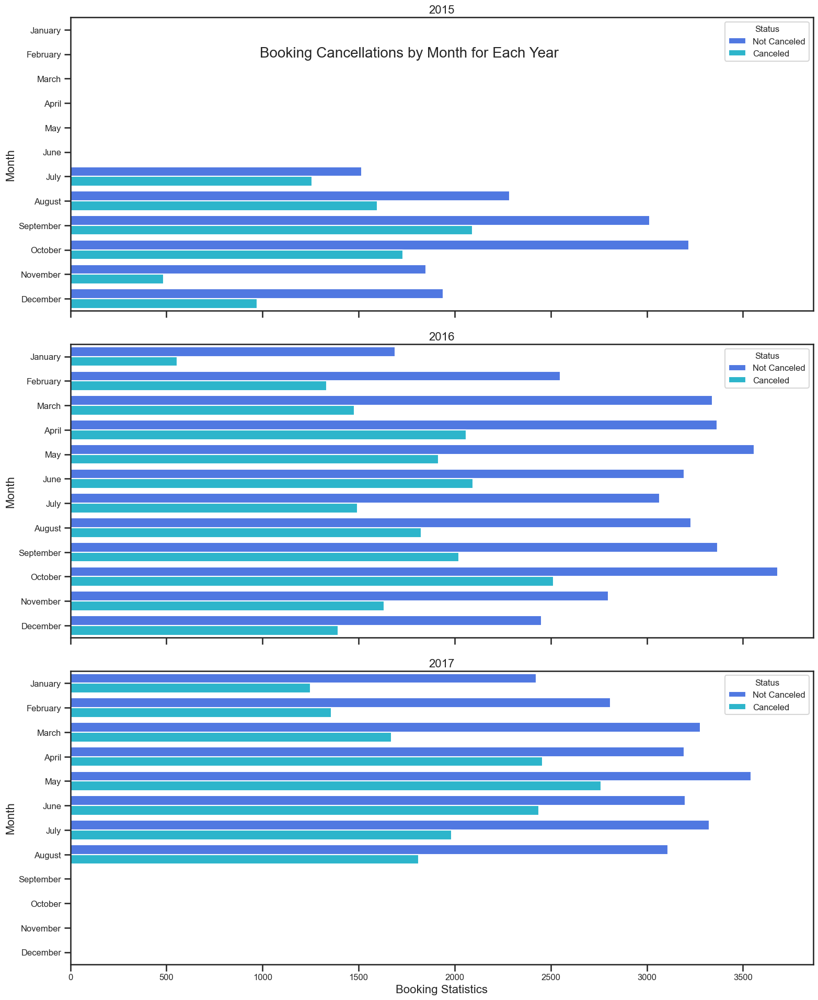

In [18]:

# Filter data by year
data_2015 = df[df["arrival_date_year"] == 2015]
data_2016 = df[df["arrival_date_year"] == 2016]
data_2017 = df[df["arrival_date_year"] == 2017]

# Month order for consistent sorting
ordered_month = ['January', 'February', 'March', 'April', 'May', 'June', 
                 'July', 'August', 'September', 'October', 'November', 'December']

# Create figure with 3 subplots
fig, ax = plt.subplots(3, 1, sharex=True, figsize=(16, 20))
data = [data_2015, data_2016, data_2017]
years = [2015, 2016, 2017]

# Plot each year's data
for i, year_data in enumerate(data):
    # Map is_canceled to meaningful labels
    year_data = year_data.copy()
    year_data['cancel_status'] = year_data['is_canceled'].map({0: 'Not Canceled', 1: 'Canceled'})
    
    ax[i].set_title(f'{years[i]}', fontsize=16)
    sns.countplot(data=year_data, 
                 y="arrival_date_month", 
                 hue="cancel_status",
                 hue_order=['Not Canceled', 'Canceled'],
                 order=ordered_month, 
                 ax=ax[i])
    
    ax[i].set_ylabel('Month', fontsize=16)
    ax[i].set_xlabel('Booking Statistics', fontsize=16)
    ax[i].tick_params(labelsize=12)
    ax[i].legend(fontsize=12, title='Status', title_fontsize=12)

plt.suptitle("Booking Cancellations by Month for Each Year", fontsize=20, y=0.92)
plt.tight_layout()
plt.show()

Maximum number of cancellations were seen during summer. The number of cancellations increases with increase in the number of bookings. 

### **Q. How long people stay in each hotel?**

Now, let us make a seperate dataframe for all the valid hotel bookings (ie. bookings which were not canceled).

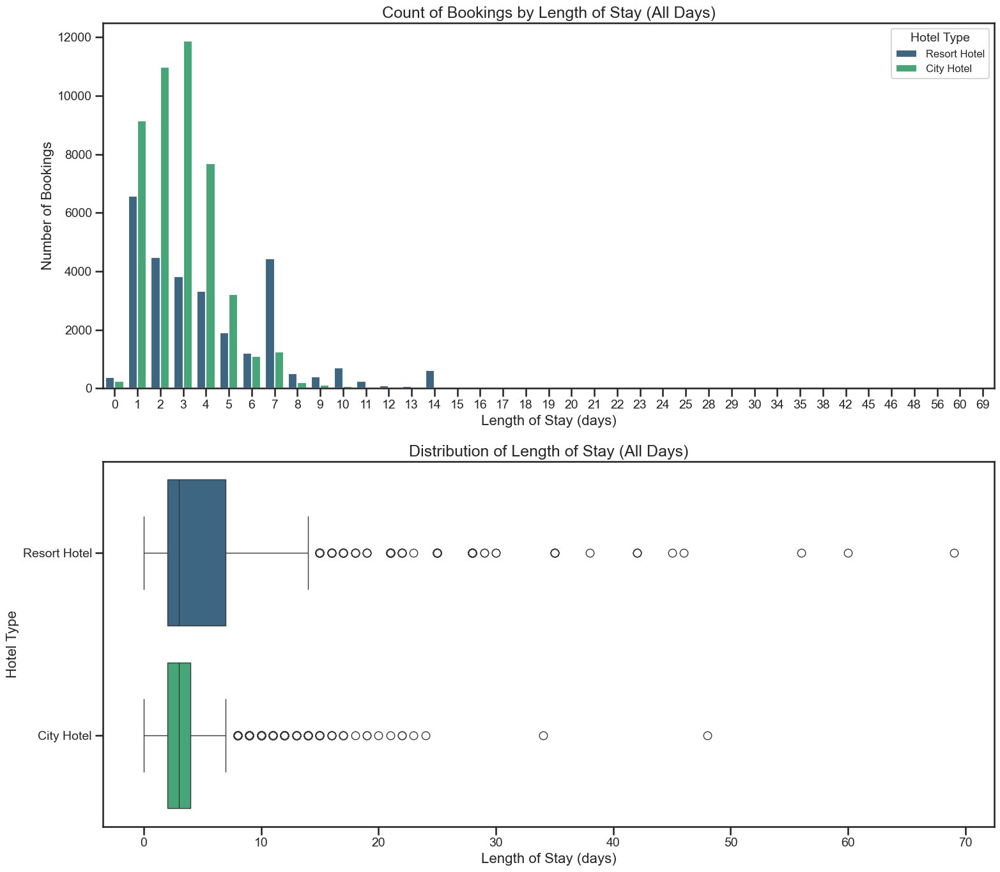

In [19]:

# Filter only confirmed bookings and calculate length of stay
confirmed_bookings = df[df['is_canceled'] == 0].copy()
confirmed_bookings['length_of_stay'] = (confirmed_bookings['stays_in_weekend_nights'] + 
                                      confirmed_bookings['stays_in_week_nights'])

# Create figure with 2 subplots
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(16, 14))

# Countplot of length of stay (all days)
sns.countplot(x='length_of_stay', hue='hotel',
              data=confirmed_bookings,
              ax=ax[0], palette='viridis')
ax[0].set_title('Count of Bookings by Length of Stay (All Days)', fontsize=18)
ax[0].set_ylabel('Number of Bookings', fontsize=16)
ax[0].set_xlabel('Length of Stay (days)', fontsize=16)
ax[0].legend(title='Hotel Type', fontsize=12, title_fontsize=14)
ax[0].tick_params(axis='both', labelsize=14)

# Boxplot of length of stay (all days)
sns.boxplot(x='length_of_stay', y='hotel',
            data=confirmed_bookings,
            ax=ax[1], palette='viridis')
ax[1].set_title('Distribution of Length of Stay (All Days)', fontsize=18)
ax[1].set_ylabel('Hotel Type', fontsize=16)
ax[1].set_xlabel('Length of Stay (days)', fontsize=16)
ax[1].tick_params(axis='both', labelsize=14)

plt.tight_layout()
plt.show()


### **Q. How significance is it to have a parking space?**

Let us have a overview of the importance of having a parking space in each of the hotel.

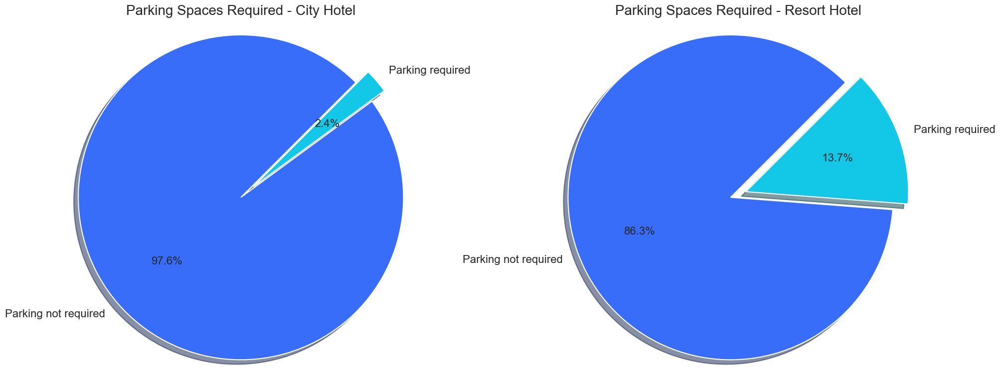

In [20]:

# Filter data by hotel type
city_ht = df[df['hotel'] == 'City Hotel']
resort_ht = df[df['hotel'] == 'Resort Hotel']

# Create figure with 2 subplots
fig, ax = plt.subplots(1, 2, figsize=(20, 8))
explode = (0.05, 0.05)

# Calculate parking space requirements
pie_city = city_ht['required_car_parking_spaces'].value_counts(normalize=True)
pie_resort = resort_ht['required_car_parking_spaces'].value_counts(normalize=True)
titles = ['City Hotel', 'Resort Hotel']

# Create pie charts
for i, pie in enumerate([pie_city, pie_resort]):
    # Convert parking spaces to binary (0 = not required, 1+ = required)
    parking_required = pie.get(0, 0)  # Not required (0 spaces)
    parking_not_required = 1 - parking_required  # Required (1+ spaces)
    
    ax[i].pie([parking_required, parking_not_required], 
              labels=['Parking not required', 'Parking required'], 
              autopct='%1.1f%%', 
              explode=explode, 
              startangle=45, 
              textprops={'fontsize': 16}, 
              shadow=True)
    ax[i].set_title(f'Parking Spaces Required - {titles[i]}', fontsize=20)
    ax[i].axis('equal')  # Ensure pie is drawn as a circle

plt.tight_layout()
plt.show()

* The pie charts show that a majority of customers in both City and Resort hotel do not have a need for a parking space. However, the proportion of customers who require a parking space is higher in Resort hotel compared to City hotel, reaching **15.9%**. 
* This highlights the importance of providing **at least 1** parking space per reservation in resort hotels to meet the demands of their customers.

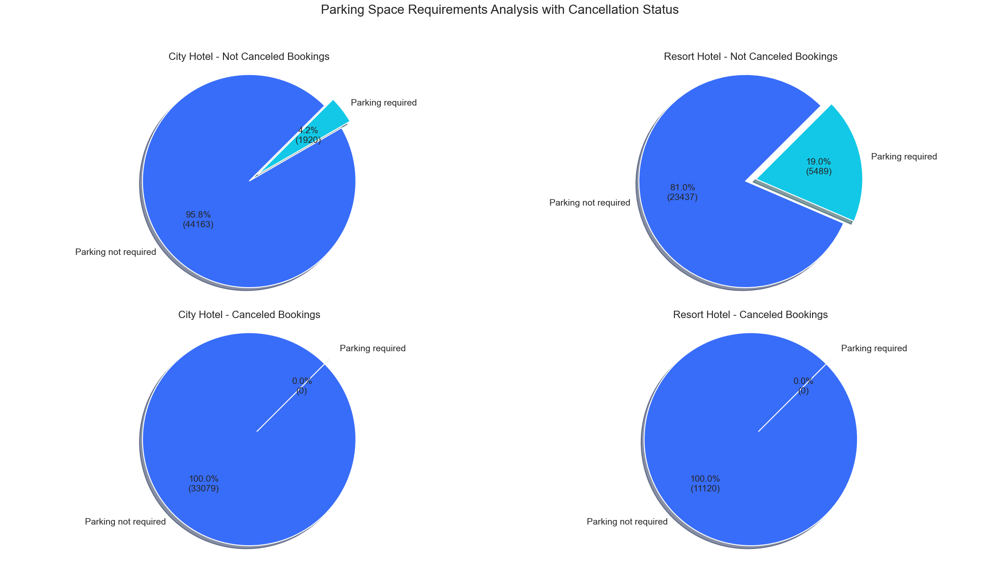

In [21]:

# Filter data by hotel type
city_ht = df[df['hotel'] == 'City Hotel']
resort_ht = df[df['hotel'] == 'Resort Hotel']

# Create figure with 4 subplots (2 rows, 2 columns)
fig, ax = plt.subplots(2, 2, figsize=(22, 12))
explode = (0.05, 0.05)
titles = ['City Hotel', 'Resort Hotel']

# Define function to create pie charts
def create_pie_chart(data, ax, title, status):
    parking_required = data[data['required_car_parking_spaces'] > 0]
    parking_not_required = data[data['required_car_parking_spaces'] == 0]
    
    sizes = [len(parking_not_required), len(parking_required)]
    total = sum(sizes)
    
    if total > 0:  # Only plot if there's data
        ax.pie(sizes, 
              labels=['Parking not required', 'Parking required'], 
              autopct=lambda p: f'{p:.1f}%\n({int(p*total/100)})', 
              explode=explode, 
              startangle=45, 
              textprops={'fontsize': 14}, 
              shadow=True)
        ax.set_title(f'{title} - {status} Bookings', fontsize=16)
        ax.axis('equal')

# Create pie charts for each combination
for i, (hotel_data, hotel_name) in enumerate(zip([city_ht, resort_ht], titles)):
    # Not Canceled bookings
    create_pie_chart(hotel_data[hotel_data['is_canceled'] == 0], ax[0,i], hotel_name, 'Not Canceled')
    # Canceled bookings
    create_pie_chart(hotel_data[hotel_data['is_canceled'] == 1], ax[1,i], hotel_name, 'Canceled')

plt.suptitle('Parking Space Requirements Analysis with Cancellation Status', fontsize=20, y=1.02)
plt.tight_layout()
plt.show()

<a id = '2.1'></a>
<p style = "font-size : 35px; color : #34656d ; font-family : 'Comic Sans MS'; "><strong>From where the most guests are coming ?.</strong></p> 

In [22]:
country_wise_guests = df[df['is_canceled'] == 0]['country'].value_counts().reset_index()
country_wise_guests.columns = ['country', 'No of guests']
country_wise_guests

,country,No of guests
0,PRT,20977
1,GBR,9668
2,FRA,8468
3,ESP,6383
4,DEU,6067
...,...,...
161,BHR,1
162,DJI,1
163,MLI,1
164,NPL,1


In [23]:
basemap = folium.Map()
guests_map = px.choropleth(country_wise_guests, locations = country_wise_guests['country'],
                           color = country_wise_guests['No of guests'], hover_name = country_wise_guests['country'])
guests_map.show()

<p style = "font-size : 20px; color : #810000 ; font-family : 'Comic Sans MS'; "><strong>People from all over the world are staying in these two hotels. Most guests are from Portugal and other countries in Europe.</strong></p> 

<a id = '2.2'></a>
<p style = "font-size : 35px; color : #34656d ; font-family : 'Comic Sans MS'; "><strong>How much do guests pay for a room per night?</strong></p> 

In [24]:
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,0.0,0.0,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,0.0,0.0,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,0.0,0.0,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,0.0,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0.0,0,Transient,98.0,0,1,Check-Out,2015-07-03


<p style = "font-size : 20px; color : #810000 ; font-family : 'Comic Sans MS'; "><strong>Both hotels have different room types and different meal arrangements.Seasonal factors are also important, So the prices varies a lot.</strong></p> 

In [25]:
data = df[df['is_canceled'] == 0]

px.box(data_frame = data, x = 'reserved_room_type', y = 'adr', color = 'hotel', template = 'plotly_dark')

<p style = "font-size : 20px; color : #810000 ; font-family : 'Comic Sans MS'; "><strong>The figure shows that the average price per room depends on its type and the standard deviation.</strong></p> 

<a id = '2.3'></a>
<p style = "font-size : 35px; color : #34656d ; font-family : 'Comic Sans MS'; "><strong>How does the price vary per night over the year?</strong></p> 

In [26]:
data_resort = df[(df['hotel'] == 'Resort Hotel') & (df['is_canceled'] == 0)]
data_city = df[(df['hotel'] == 'City Hotel') & (df['is_canceled'] == 0)]

In [27]:
resort_hotel = data_resort.groupby(['arrival_date_month'])['adr'].mean().reset_index()
resort_hotel

,arrival_date_month,adr
0,April,75.867816
1,August,181.205892
2,December,68.410104
3,February,54.147478
4,January,48.761125
5,July,150.122528
6,June,107.974850
7,March,57.056838
8,May,76.657558
9,November,48.706289


In [28]:
city_hotel=data_city.groupby(['arrival_date_month'])['adr'].mean().reset_index()
city_hotel

,arrival_date_month,adr
0,April,111.962267
1,August,118.674598
2,December,88.401855
3,February,86.520062
4,January,82.330983
5,July,115.818019
6,June,117.874360
7,March,90.658533
8,May,120.669827
9,November,86.946592


In [29]:
final_hotel = resort_hotel.merge(city_hotel, on = 'arrival_date_month')
final_hotel.columns = ['month', 'price_for_resort', 'price_for_city_hotel']
final_hotel

,month,price_for_resort,price_for_city_hotel
0,April,75.867816,111.962267
1,August,181.205892,118.674598
2,December,68.410104,88.401855
3,February,54.147478,86.520062
4,January,48.761125,82.330983
5,July,150.122528,115.818019
6,June,107.974850,117.874360
7,March,57.056838,90.658533
8,May,76.657558,120.669827
9,November,48.706289,86.946592


<p style = "font-size : 20px; color : #810000 ; font-family : 'Comic Sans MS'; "><strong>Now we observe here that month column is not in order, and if we visualize we will get improper conclusions.</strong></p>

<p style = "font-size : 20px; color : #810000 ; font-family : 'Comic Sans MS'; "><strong>So, first we have to provide right hierarchy to month column.</strong></p>

In [33]:
import sort_dataframeby_monthorweek as sd

def sort_month(df, column_name):
    return sd.Sort_Dataframeby_Month(df, column_name)

In [34]:
final_prices = sort_month(final_hotel, 'month')
final_prices

,month,price_for_resort,price_for_city_hotel
0,January,48.761125,82.330983
1,February,54.147478,86.520062
2,March,57.056838,90.658533
3,April,75.867816,111.962267
4,May,76.657558,120.669827
5,June,107.974850,117.874360
6,July,150.122528,115.818019
7,August,181.205892,118.674598
8,September,96.416860,112.776582
9,October,61.775449,102.004672


In [35]:
plt.figure(figsize = (17, 8))

px.line(final_prices, x = 'month', y = ['price_for_resort','price_for_city_hotel'],
        title = 'Room price per night over the Months', template = 'plotly_dark')

<Figure size 1700x800 with 0 Axes>

<p style = "font-size : 20px; color : #810000 ; font-family : 'Comic Sans MS'; "><strong>This plot clearly shows that prices in the Resort Hotel are much higher during the summer and prices of city hotel varies less and is most expensive during Spring and Autumn .</strong></p>

<a id = '2.4'></a>
<p style = "font-size : 35px; color : #34656d ; font-family : 'Comic Sans MS'; "><strong>Which are the most busy months?</strong></p> 

In [36]:
resort_guests = data_resort['arrival_date_month'].value_counts().reset_index()
resort_guests.columns=['month','no of guests']
resort_guests

,month,no of guests
0,August,3257
1,July,3137
2,October,2575
3,March,2571
4,April,2550
5,May,2535
6,February,2308
7,September,2102
8,June,2037
9,December,2014


In [37]:
city_guests = data_city['arrival_date_month'].value_counts().reset_index()
city_guests.columns=['month','no of guests']
city_guests

,month,no of guests
0,August,5367
1,July,4770
2,May,4568
3,June,4358
4,October,4326
5,September,4283
6,March,4049
7,April,4010
8,February,3051
9,November,2676


In [38]:
final_guests = resort_guests.merge(city_guests,on='month')
final_guests.columns=['month','no of guests in resort','no of guest in city hotel']
final_guests

,month,no of guests in resort,no of guest in city hotel
0,August,3257,5367
1,July,3137,4770
2,October,2575,4326
3,March,2571,4049
4,April,2550,4010
5,May,2535,4568
6,February,2308,3051
7,September,2102,4283
8,June,2037,4358
9,December,2014,2377


In [39]:
final_guests = sort_month(final_guests,'month')
final_guests

,month,no of guests in resort,no of guest in city hotel
0,January,1866,2249
1,February,2308,3051
2,March,2571,4049
3,April,2550,4010
4,May,2535,4568
5,June,2037,4358
6,July,3137,4770
7,August,3257,5367
8,September,2102,4283
9,October,2575,4326


In [40]:
px.line(final_guests, x = 'month', y = ['no of guests in resort','no of guest in city hotel'],
        title='Total no of guests per Months', template = 'plotly_dark')

<ul>
    <li style = "font-size : 20px; color : #810000 ; font-family : 'Comic Sans MS'; "><strong>The City hotel has more guests during spring and autumn, when the prices are also highest, In July and August there are less visitors, although prices are lower.</strong></li>
    <li style = "font-size : 20px; color : #810000 ; font-family : 'Comic Sans MS'; "><strong>Guest numbers for the Resort hotel go down slighty from June to September, which is also when the prices are highest. Both hotels have the fewest guests during the winter.</strong></li>
</ul>

<a id = '2.5'></a>
<p style = "font-size : 35px; color : #34656d ; font-family : 'Comic Sans MS'; "><strong>How long do people stay at the hotels?</strong></p> 

In [41]:
filter = df['is_canceled'] == 0
data = df[filter]
data.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,0.0,0.0,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,0.0,0.0,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,0.0,0.0,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,0.0,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0.0,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [42]:
data['total_nights'] = data['stays_in_weekend_nights'] + data['stays_in_week_nights']
data.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,...,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,total_nights
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,...,0,0,C,C,3,No Deposit,0.0,0.0,0,Transient,0.0,0,0,Check-Out,2015-07-01,0
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,...,0,0,C,C,4,No Deposit,0.0,0.0,0,Transient,0.0,0,0,Check-Out,2015-07-01,0
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,...,0,0,A,C,0,No Deposit,0.0,0.0,0,Transient,75.0,0,0,Check-Out,2015-07-02,1
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,...,0,0,A,A,0,No Deposit,304.0,0.0,0,Transient,75.0,0,0,Check-Out,2015-07-02,1
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,...,0,0,A,A,0,No Deposit,240.0,0.0,0,Transient,98.0,0,1,Check-Out,2015-07-03,2


In [43]:
stay = data.groupby(['total_nights', 'hotel']).agg('count').reset_index()
stay = stay.iloc[:, :3]
stay = stay.rename(columns={'is_canceled':'Number of stays'})
stay

,total_nights,hotel,Number of stays
0,0,City Hotel,251
1,0,Resort Hotel,371
2,1,City Hotel,9155
3,1,Resort Hotel,6579
4,2,City Hotel,10983
...,...,...,...
57,46,Resort Hotel,1
58,48,City Hotel,1
59,56,Resort Hotel,1
60,60,Resort Hotel,1


In [44]:
px.bar(data_frame = stay, x = 'total_nights', y = 'Number of stays', color = 'hotel', barmode = 'group',
        template = 'plotly_dark')

<a id = '3.0'></a>
<p style = "font-size : 40px; color : #34656d ; font-family : 'Comic Sans MS'; text-align : center; background-color : #f9b208; border-radius: 5px 5px;"><strong>Data Pre Processing</strong></p> 

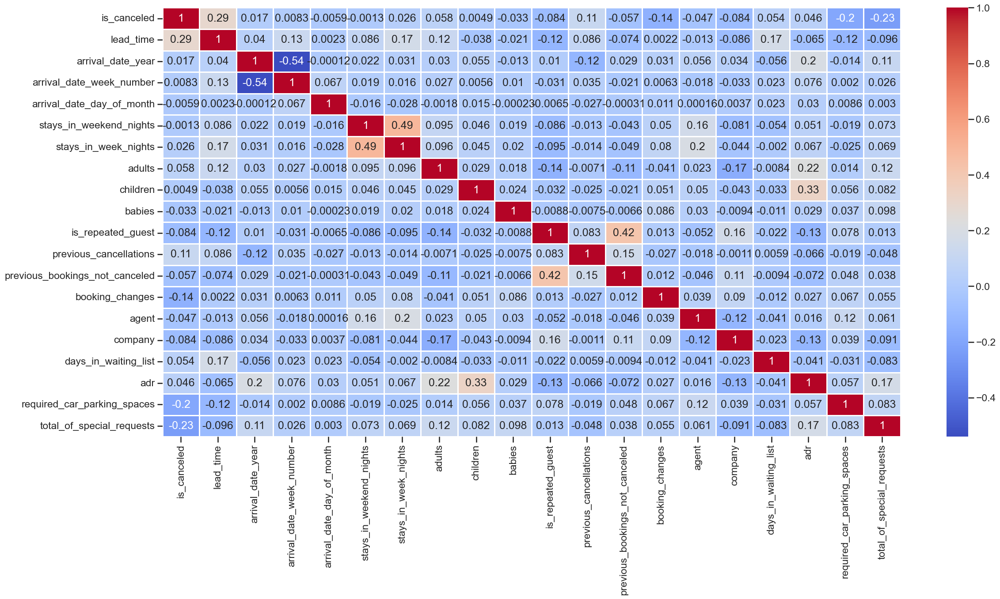

In [45]:
plt.figure(figsize=(24, 12))

# Select only numeric columns
numeric_df = df.select_dtypes(include='number')

# Now compute correlation
corr = numeric_df.corr()

# Plot heatmap
sns.heatmap(corr, annot=True, linewidths=1, cmap='coolwarm')
plt.show()


In [46]:
# Select only numeric columns
numeric_df = df.select_dtypes(include='number')

# Now safely compute correlation
correlation = numeric_df.corr()['is_canceled'].abs().sort_values(ascending=False)
correlation


is_canceled                       1.000000
lead_time                         0.292876
total_of_special_requests         0.234877
required_car_parking_spaces       0.195701
booking_changes                   0.144832
previous_cancellations            0.110139
is_repeated_guest                 0.083745
company                           0.083594
adults                            0.058182
previous_bookings_not_canceled    0.057365
days_in_waiting_list              0.054301
agent                             0.046770
adr                               0.046492
babies                            0.032569
stays_in_week_nights              0.025542
arrival_date_year                 0.016622
arrival_date_week_number          0.008315
arrival_date_day_of_month         0.005948
children                          0.004851
stays_in_weekend_nights           0.001323
Name: is_canceled, dtype: float64

In [47]:
# dropping columns that are not useful

useless_col = ['days_in_waiting_list', 'arrival_date_year', 'arrival_date_year', 'assigned_room_type', 'booking_changes',
               'reservation_status', 'country', 'days_in_waiting_list']

df.drop(useless_col, axis = 1, inplace = True)

In [48]:
df.head()

,hotel,is_canceled,lead_time,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,deposit_type,agent,company,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status_date
0,Resort Hotel,0,342,July,27,1,0,0,2,0.0,0,BB,Direct,Direct,0,0,0,C,No Deposit,0.0,0.0,Transient,0.0,0,0,2015-07-01
1,Resort Hotel,0,737,July,27,1,0,0,2,0.0,0,BB,Direct,Direct,0,0,0,C,No Deposit,0.0,0.0,Transient,0.0,0,0,2015-07-01
2,Resort Hotel,0,7,July,27,1,0,1,1,0.0,0,BB,Direct,Direct,0,0,0,A,No Deposit,0.0,0.0,Transient,75.0,0,0,2015-07-02
3,Resort Hotel,0,13,July,27,1,0,1,1,0.0,0,BB,Corporate,Corporate,0,0,0,A,No Deposit,304.0,0.0,Transient,75.0,0,0,2015-07-02
4,Resort Hotel,0,14,July,27,1,0,2,2,0.0,0,BB,Online TA,TA/TO,0,0,0,A,No Deposit,240.0,0.0,Transient,98.0,0,1,2015-07-03


In [49]:
# creating numerical and categorical dataframes

cat_cols = [col for col in df.columns if df[col].dtype == 'O']
cat_cols

['hotel',
 'arrival_date_month',
 'meal',
 'market_segment',
 'distribution_channel',
 'reserved_room_type',
 'deposit_type',
 'customer_type',
 'reservation_status_date']

In [50]:
cat_df = df[cat_cols]
cat_df.head()

,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,reservation_status_date
0,Resort Hotel,July,BB,Direct,Direct,C,No Deposit,Transient,2015-07-01
1,Resort Hotel,July,BB,Direct,Direct,C,No Deposit,Transient,2015-07-01
2,Resort Hotel,July,BB,Direct,Direct,A,No Deposit,Transient,2015-07-02
3,Resort Hotel,July,BB,Corporate,Corporate,A,No Deposit,Transient,2015-07-02
4,Resort Hotel,July,BB,Online TA,TA/TO,A,No Deposit,Transient,2015-07-03


In [51]:
cat_df['reservation_status_date'] = pd.to_datetime(cat_df['reservation_status_date'])

cat_df['year'] = cat_df['reservation_status_date'].dt.year
cat_df['month'] = cat_df['reservation_status_date'].dt.month
cat_df['day'] = cat_df['reservation_status_date'].dt.day

In [52]:
cat_df.drop(['reservation_status_date','arrival_date_month'] , axis = 1, inplace = True)

In [53]:
cat_df.head()

,hotel,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,year,month,day
0,Resort Hotel,BB,Direct,Direct,C,No Deposit,Transient,2015,7,1
1,Resort Hotel,BB,Direct,Direct,C,No Deposit,Transient,2015,7,1
2,Resort Hotel,BB,Direct,Direct,A,No Deposit,Transient,2015,7,2
3,Resort Hotel,BB,Corporate,Corporate,A,No Deposit,Transient,2015,7,2
4,Resort Hotel,BB,Online TA,TA/TO,A,No Deposit,Transient,2015,7,3


In [54]:
# printing unique values of each column
for col in cat_df.columns:
    print(f"{col}: \n{cat_df[col].unique()}\n")

hotel: 
['Resort Hotel' 'City Hotel']

meal: 
['BB' 'FB' 'HB' 'SC' 'Undefined']

market_segment: 
['Direct' 'Corporate' 'Online TA' 'Offline TA/TO' 'Complementary' 'Groups'
 'Undefined' 'Aviation']

distribution_channel: 
['Direct' 'Corporate' 'TA/TO' 'Undefined' 'GDS']

reserved_room_type: 
['C' 'A' 'D' 'E' 'G' 'F' 'H' 'L' 'B']

deposit_type: 
['No Deposit' 'Refundable' 'Non Refund']

customer_type: 
['Transient' 'Contract' 'Transient-Party' 'Group']

year: 
[2015 2014 2016 2017]

month: 
[ 7  5  4  6  3  8  9  1 11 10 12  2]

day: 
[ 1  2  3  6 22 23  5  7  8 11 15 16 29 19 18  9 13  4 12 26 17 10 20 14
 30 28 25 21 27 24 31]



In [55]:
# encoding categorical variables

cat_df['hotel'] = cat_df['hotel'].map({'Resort Hotel' : 0, 'City Hotel' : 1})

cat_df['meal'] = cat_df['meal'].map({'BB' : 0, 'FB': 1, 'HB': 2, 'SC': 3, 'Undefined': 4})

cat_df['market_segment'] = cat_df['market_segment'].map({'Direct': 0, 'Corporate': 1, 'Online TA': 2, 'Offline TA/TO': 3,
                                                           'Complementary': 4, 'Groups': 5, 'Undefined': 6, 'Aviation': 7})

cat_df['distribution_channel'] = cat_df['distribution_channel'].map({'Direct': 0, 'Corporate': 1, 'TA/TO': 2, 'Undefined': 3,
                                                                       'GDS': 4})

cat_df['reserved_room_type'] = cat_df['reserved_room_type'].map({'C': 0, 'A': 1, 'D': 2, 'E': 3, 'G': 4, 'F': 5, 'H': 6,
                                                                   'L': 7, 'B': 8})

cat_df['deposit_type'] = cat_df['deposit_type'].map({'No Deposit': 0, 'Refundable': 1, 'Non Refund': 3})

cat_df['customer_type'] = cat_df['customer_type'].map({'Transient': 0, 'Contract': 1, 'Transient-Party': 2, 'Group': 3})

cat_df['year'] = cat_df['year'].map({2015: 0, 2014: 1, 2016: 2, 2017: 3})

In [56]:
cat_df.head()

,hotel,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,year,month,day
0,0,0,0,0,0,0,0,0,7,1
1,0,0,0,0,0,0,0,0,7,1
2,0,0,0,0,1,0,0,0,7,2
3,0,0,1,1,1,0,0,0,7,2
4,0,0,2,2,1,0,0,0,7,3


In [57]:
num_df = df.drop(columns = cat_cols, axis = 1)
# num_df.drop('is_canceled', axis = 1, inplace = True)
num_df

,is_canceled,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,agent,company,adr,required_car_parking_spaces,total_of_special_requests
0,0,342,27,1,0,0,2,0.0,0,0,0,0,0.0,0.0,0.00,0,0
1,0,737,27,1,0,0,2,0.0,0,0,0,0,0.0,0.0,0.00,0,0
2,0,7,27,1,0,1,1,0.0,0,0,0,0,0.0,0.0,75.00,0,0
3,0,13,27,1,0,1,1,0.0,0,0,0,0,304.0,0.0,75.00,0,0
4,0,14,27,1,0,2,2,0.0,0,0,0,0,240.0,0.0,98.00,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,0,23,35,30,2,5,2,0.0,0,0,0,0,394.0,0.0,96.14,0,0
119386,0,102,35,31,2,5,3,0.0,0,0,0,0,9.0,0.0,225.43,0,2
119387,0,34,35,31,2,5,2,0.0,0,0,0,0,9.0,0.0,157.71,0,4
119388,0,109,35,31,2,5,2,0.0,0,0,0,0,89.0,0.0,104.40,0,0


In [58]:
num_df.var()

is_canceled                           0.233300
lead_time                         11422.361808
arrival_date_week_number            184.990111
arrival_date_day_of_month            77.107192
stays_in_weekend_nights               0.990258
stays_in_week_nights                  3.599010
adults                                0.330838
children                              0.159070
babies                                0.009508
is_repeated_guest                     0.030507
previous_cancellations                0.713887
previous_bookings_not_canceled        2.244415
agent                             11485.169679
company                            2897.684308
adr                                2543.589039
required_car_parking_spaces           0.060201
total_of_special_requests             0.628652
dtype: float64

In [59]:
# normalizing numerical variables

num_df['lead_time'] = np.log(num_df['lead_time'] + 1)
num_df['arrival_date_week_number'] = np.log(num_df['arrival_date_week_number'] + 1)
num_df['arrival_date_day_of_month'] = np.log(num_df['arrival_date_day_of_month'] + 1)
num_df['agent'] = np.log(num_df['agent'] + 1)
num_df['company'] = np.log(num_df['company'] + 1)
num_df['adr'] = np.log(num_df['adr'] + 1)

In [60]:
num_df.var()

is_canceled                       0.233300
lead_time                         2.582757
arrival_date_week_number          0.440884
arrival_date_day_of_month         0.506325
stays_in_weekend_nights           0.990258
stays_in_week_nights              3.599010
adults                            0.330838
children                          0.159070
babies                            0.009508
is_repeated_guest                 0.030507
previous_cancellations            0.713887
previous_bookings_not_canceled    2.244415
agent                             3.535793
company                           1.346883
adr                               0.515480
required_car_parking_spaces       0.060201
total_of_special_requests         0.628652
dtype: float64

In [61]:
num_df['adr'] = num_df['adr'].fillna(value = num_df['adr'].mean())

In [62]:
num_df.head()

,is_canceled,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,agent,company,adr,required_car_parking_spaces,total_of_special_requests
0,0,5.837730,3.332205,0.693147,0,0,2,0.0,0,0,0,0,0.000000,0.0,0.000000,0,0
1,0,6.603944,3.332205,0.693147,0,0,2,0.0,0,0,0,0,0.000000,0.0,0.000000,0,0
2,0,2.079442,3.332205,0.693147,0,1,1,0.0,0,0,0,0,0.000000,0.0,4.330733,0,0
3,0,2.639057,3.332205,0.693147,0,1,1,0.0,0,0,0,0,5.720312,0.0,4.330733,0,0
4,0,2.708050,3.332205,0.693147,0,2,2,0.0,0,0,0,0,5.484797,0.0,4.595120,0,1


In [63]:

# Assuming cat_df and num_df are already defined and have the same number of rows
combined_df = pd.concat([cat_df, num_df], axis=1)

# Save to CSV
# combined_df.to_csv('hotel_demand_booking_encoded_data.csv', index=False)
combined_df


,hotel,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,year,month,day,is_canceled,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,agent,company,adr,required_car_parking_spaces,total_of_special_requests
0,0,0,0,0,0,0,0,0,7,1,0,5.837730,3.332205,0.693147,0,0,2,0.0,0,0,0,0,0.000000,0.0,0.000000,0,0
1,0,0,0,0,0,0,0,0,7,1,0,6.603944,3.332205,0.693147,0,0,2,0.0,0,0,0,0,0.000000,0.0,0.000000,0,0
2,0,0,0,0,1,0,0,0,7,2,0,2.079442,3.332205,0.693147,0,1,1,0.0,0,0,0,0,0.000000,0.0,4.330733,0,0
3,0,0,1,1,1,0,0,0,7,2,0,2.639057,3.332205,0.693147,0,1,1,0.0,0,0,0,0,5.720312,0.0,4.330733,0,0
4,0,0,2,2,1,0,0,0,7,3,0,2.708050,3.332205,0.693147,0,2,2,0.0,0,0,0,0,5.484797,0.0,4.595120,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,1,0,3,2,1,0,0,3,9,6,0,3.178054,3.583519,3.433987,2,5,2,0.0,0,0,0,0,5.978886,0.0,4.576153,0,0
119386,1,0,2,2,3,0,0,3,9,7,0,4.634729,3.583519,3.465736,2,5,3,0.0,0,0,0,0,2.302585,0.0,5.422436,0,2
119387,1,0,2,2,2,0,0,3,9,7,0,3.555348,3.583519,3.465736,2,5,2,0.0,0,0,0,0,2.302585,0.0,5.067079,0,4
119388,1,0,2,2,1,0,0,3,9,7,0,4.700480,3.583519,3.465736,2,5,2,0.0,0,0,0,0,4.499810,0.0,4.657763,0,0


In [65]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import warnings
warnings.filterwarnings('ignore')

# Assuming combined_df is already created from your previous code
# Prepare features and target
X = combined_df.drop('is_canceled', axis=1)
y = combined_df['is_canceled']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Dictionary to store results
results = {}

# 1. Logistic Regression
lr_model = LogisticRegression(
    random_state=42,
    max_iter=1000,
    solver='lbfgs',
    C=1.0
)
lr_model.fit(X_train_scaled, y_train)
lr_predictions = lr_model.predict(X_test_scaled)
results['Logistic Regression'] = {
    'accuracy': accuracy_score(y_test, lr_predictions),
    'confusion_matrix': confusion_matrix(y_test, lr_predictions),
    'classification_report': classification_report(y_test, lr_predictions)
}

# 2. Decision Tree Classifier
dt_model = DecisionTreeClassifier(
    random_state=42,
    max_depth=10,
    min_samples_split=5,
    min_samples_leaf=2
)
dt_model.fit(X_train_scaled, y_train)
dt_predictions = dt_model.predict(X_test_scaled)
results['Decision Tree'] = {
    'accuracy': accuracy_score(y_test, dt_predictions),
    'confusion_matrix': confusion_matrix(y_test, dt_predictions),
    'classification_report': classification_report(y_test, dt_predictions)
}

# 3. Random Forest Classifier
rf_model = RandomForestClassifier(
    random_state=42,
    n_estimators=100,
    max_depth=10,
    min_samples_split=5,
    min_samples_leaf=2,
    n_jobs=-1
)
rf_model.fit(X_train_scaled, y_train)
rf_predictions = rf_model.predict(X_test_scaled)
results['Random Forest'] = {
    'accuracy': accuracy_score(y_test, rf_predictions),
    'confusion_matrix': confusion_matrix(y_test, rf_predictions),
    'classification_report': classification_report(y_test, rf_predictions)
}

# 4. K-Nearest Neighbors
knn_model = KNeighborsClassifier(
    n_neighbors=5,
    weights='distance',
    metric='euclidean',
    n_jobs=-1
)
knn_model.fit(X_train_scaled, y_train)
knn_predictions = knn_model.predict(X_test_scaled)
results['KNN'] = {
    'accuracy': accuracy_score(y_test, knn_predictions),
    'confusion_matrix': confusion_matrix(y_test, knn_predictions),
    'classification_report': classification_report(y_test, knn_predictions)
}

# 5. Naive Bayes
nb_model = GaussianNB()
nb_model.fit(X_train_scaled, y_train)
nb_predictions = nb_model.predict(X_test_scaled)
results['Naive Bayes'] = {
    'accuracy': accuracy_score(y_test, nb_predictions),
    'confusion_matrix': confusion_matrix(y_test, nb_predictions),
    'classification_report': classification_report(y_test, nb_predictions)
}

# Print results for each model
for model_name, metrics in results.items():
    print(f"\n{model_name} Results:")
    print(f"Accuracy: {metrics['accuracy']:.4f}")
    print("\nConfusion Matrix:")
    print(metrics['confusion_matrix'])
    print("\nClassification Report:")
    print(metrics['classification_report'])


Logistic Regression Results:
Accuracy: 0.8066

Confusion Matrix:
[[14130   828]
 [ 3782  5102]]

Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.94      0.86     14958
           1       0.86      0.57      0.69      8884

    accuracy                           0.81     23842
   macro avg       0.82      0.76      0.77     23842
weighted avg       0.82      0.81      0.80     23842


Decision Tree Results:
Accuracy: 0.8472

Confusion Matrix:
[[14267   691]
 [ 2951  5933]]

Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.95      0.89     14958
           1       0.90      0.67      0.77      8884

    accuracy                           0.85     23842
   macro avg       0.86      0.81      0.83     23842
weighted avg       0.85      0.85      0.84     23842


Random Forest Results:
Accuracy: 0.8457

Confusion Matrix:
[[14473   485]
 [ 3194  5690]]

Classification Rep

In [66]:
# Print results for each model
for model_name, metrics in results.items():
    print(f"\n{model_name} Results:")
    print(f"Accuracy: {metrics['accuracy']:.4f}")


Logistic Regression Results:
Accuracy: 0.8066

Decision Tree Results:
Accuracy: 0.8472

Random Forest Results:
Accuracy: 0.8457

KNN Results:
Accuracy: 0.9091

Naive Bayes Results:
Accuracy: 0.5061


In [67]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import warnings
warnings.filterwarnings('ignore')

# Assuming combined_df is already created from your previous code
# Prepare features and target
X = combined_df.drop('is_canceled', axis=1)
y = combined_df['is_canceled']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Dictionary to store results
results = {}

# 1. Logistic Regression with GridSearchCV
lr_param_grid = {
    'C': [0.01, 0.1, 1.0, 10.0],
    'solver': ['lbfgs', 'liblinear'],
    'max_iter': [1000]
}
lr_model = LogisticRegression(random_state=42)
lr_grid = GridSearchCV(lr_model, lr_param_grid, cv=5, scoring='accuracy', n_jobs=-1)
lr_grid.fit(X_train_scaled, y_train)
lr_predictions = lr_grid.predict(X_test_scaled)
results['Logistic Regression'] = {
    'best_params': lr_grid.best_params_,
    'best_score': lr_grid.best_score_,
    'test_accuracy': accuracy_score(y_test, lr_predictions),
    'confusion_matrix': confusion_matrix(y_test, lr_predictions),
    'classification_report': classification_report(y_test, lr_predictions)
}

# 2. Decision Tree Classifier with GridSearchCV
dt_param_grid = {
    'max_depth': [5, 10, 15, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
dt_model = DecisionTreeClassifier(random_state=42)
dt_grid = GridSearchCV(dt_model, dt_param_grid, cv=5, scoring='accuracy', n_jobs=-1)
dt_grid.fit(X_train_scaled, y_train)
dt_predictions = dt_grid.predict(X_test_scaled)
results['Decision Tree'] = {
    'best_params': dt_grid.best_params_,
    'best_score': dt_grid.best_score_,
    'test_accuracy': accuracy_score(y_test, dt_predictions),
    'confusion_matrix': confusion_matrix(y_test, dt_predictions),
    'classification_report': classification_report(y_test, dt_predictions)
}

# 3. Random Forest Classifier with GridSearchCV
rf_param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [5, 10, 15, None],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}
rf_model = RandomForestClassifier(random_state=42, n_jobs=-1)
rf_grid = GridSearchCV(rf_model, rf_param_grid, cv=5, scoring='accuracy', n_jobs=-1)
rf_grid.fit(X_train_scaled, y_train)
rf_predictions = rf_grid.predict(X_test_scaled)
results['Random Forest'] = {
    'best_params': rf_grid.best_params_,
    'best_score': rf_grid.best_score_,
    'test_accuracy': accuracy_score(y_test, rf_predictions),
    'confusion_matrix': confusion_matrix(y_test, rf_predictions),
    'classification_report': classification_report(y_test, rf_predictions)
}

# 4. K-Nearest Neighbors with GridSearchCV
knn_param_grid = {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}
knn_model = KNeighborsClassifier(n_jobs=-1)
knn_grid = GridSearchCV(knn_model, knn_param_grid, cv=5, scoring='accuracy', n_jobs=-1)
knn_grid.fit(X_train_scaled, y_train)
knn_predictions = knn_grid.predict(X_test_scaled)
results['KNN'] = {
    'best_params': knn_grid.best_params_,
    'best_score': knn_grid.best_score_,
    'test_accuracy': accuracy_score(y_test, knn_predictions),
    'confusion_matrix': confusion_matrix(y_test, knn_predictions),
    'classification_report': classification_report(y_test, knn_predictions)
}

# 5. Naive Bayes with GridSearchCV
# Note: GaussianNB has limited hyperparameters, using var_smoothing
nb_param_grid = {
    'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6]
}
nb_model = GaussianNB()
nb_grid = GridSearchCV(nb_model, nb_param_grid, cv=5, scoring='accuracy', n_jobs=-1)
nb_grid.fit(X_train_scaled, y_train)
nb_predictions = nb_grid.predict(X_test_scaled)
results['Naive Bayes'] = {
    'best_params': nb_grid.best_params_,
    'best_score': nb_grid.best_score_,
    'test_accuracy': accuracy_score(y_test, nb_predictions),
    'confusion_matrix': confusion_matrix(y_test, nb_predictions),
    'classification_report': classification_report(y_test, nb_predictions)
}

# # 6. Support Vector Classifier with GridSearchCV
# svc_param_grid = {
#     'C': [0.1, 1.0, 10.0],
#     'kernel': ['rbf', 'linear'],
#     'gamma': ['scale', 'auto']
# }
# svc_model = SVC(random_state=42, probability=True)
# svc_grid = GridSearchCV(svc_model, svc_param_grid, cv=5, scoring='accuracy', n_jobs=-1)
# svc_grid.fit(X_train_scaled, y_train)
# svc_predictions = svc_grid.predict(X_test_scaled)
# results['SVC'] = {
#     'best_params': svc_grid.best_params_,
#     'best_score': svc_grid.best_score_,
#     'test_accuracy': accuracy_score(y_test, svc_predictions),
#     'confusion_matrix': confusion_matrix(y_test, svc_predictions),
#     'classification_report': classification_report(y_test, svc_predictions)
# }

# Print results for each model
for model_name, metrics in results.items():
    print(f"\n{model_name} Results:")
    print(f"Best Parameters: {metrics['best_params']}")
    print(f"Best Cross-Validation Score: {metrics['best_score']:.4f}")
    print(f"Test Accuracy: {metrics['test_accuracy']:.4f}")
    print("\nConfusion Matrix:")
    print(metrics['confusion_matrix'])
    print("\nClassification Report:")
    print(metrics['classification_report'])


Logistic Regression Results:
Best Parameters: {'C': 10.0, 'max_iter': 1000, 'solver': 'lbfgs'}
Best Cross-Validation Score: 0.8125
Test Accuracy: 0.8069

Confusion Matrix:
[[14132   826]
 [ 3778  5106]]

Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.94      0.86     14958
           1       0.86      0.57      0.69      8884

    accuracy                           0.81     23842
   macro avg       0.82      0.76      0.77     23842
weighted avg       0.82      0.81      0.80     23842


Decision Tree Results:
Best Parameters: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 2}
Best Cross-Validation Score: 0.9472
Test Accuracy: 0.9543

Confusion Matrix:
[[14551   407]
 [  683  8201]]

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.97      0.96     14958
           1       0.95      0.92      0.94      8884

    accuracy                           0.

In [68]:
for model_name, metrics in results.items():
    print(f"\n{model_name} Results:")
    print(f"Test Accuracy: {metrics['test_accuracy']:.4f}")


Logistic Regression Results:
Test Accuracy: 0.8069

Decision Tree Results:
Test Accuracy: 0.9543

Random Forest Results:
Test Accuracy: 0.9578

KNN Results:
Test Accuracy: 0.9192

Naive Bayes Results:
Test Accuracy: 0.5420


In [69]:
import xgboost as xgb

In [70]:

# Assuming combined_df is already created from your previous code
# Prepare features and target
X = combined_df.drop('is_canceled', axis=1)
y = combined_df['is_canceled']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Dictionary to store results
results = {}

# XGBoost Classifier with GridSearchCV
xgb_param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 6, 9],
    'learning_rate': [0.01, 0.1, 0.3],
    'subsample': [0.7, 0.9],
    'colsample_bytree': [0.7, 0.9]
}
xgb_model = xgb.XGBClassifier(random_state=42, eval_metric='logloss', n_jobs=-1)
xgb_grid = GridSearchCV(xgb_model, xgb_param_grid, cv=5, scoring='accuracy', n_jobs=-1)
xgb_grid.fit(X_train_scaled, y_train)
xgb_predictions = xgb_grid.predict(X_test_scaled)
results['XGBoost'] = {
    'best_params': xgb_grid.best_params_,
    'best_score': xgb_grid.best_score_,
    'test_accuracy': accuracy_score(y_test, xgb_predictions),
    'confusion_matrix': confusion_matrix(y_test, xgb_predictions),
    'classification_report': classification_report(y_test, xgb_predictions)
}

# Print results for XGBoost
print("\nXGBoost Results:")
print(f"Best Parameters: {results['XGBoost']['best_params']}")
print(f"Best Cross-Validation Score: {results['XGBoost']['best_score']:.4f}")
print(f"Test Accuracy: {results['XGBoost']['test_accuracy']:.4f}")
print("\nConfusion Matrix:")
print(results['XGBoost']['confusion_matrix'])
print("\nClassification Report:")
print(results['XGBoost']['classification_report'])


XGBoost Results:
Best Parameters: {'colsample_bytree': 0.9, 'learning_rate': 0.3, 'max_depth': 9, 'n_estimators': 200, 'subsample': 0.9}
Best Cross-Validation Score: 0.9990
Test Accuracy: 0.9991

Confusion Matrix:
[[14952     6]
 [   16  8868]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     14958
           1       1.00      1.00      1.00      8884

    accuracy                           1.00     23842
   macro avg       1.00      1.00      1.00     23842
weighted avg       1.00      1.00      1.00     23842



In [71]:

# Assuming combined_df is already created from your previous code
# Prepare features and target
X = combined_df.drop('is_canceled', axis=1)
y = combined_df['is_canceled']

# Split data into training+validation and separate test set
X_temp, X_final_test, y_temp, y_final_test = train_test_split(X, y, test_size=0.1, random_state=42)
# Further split training+validation into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.2222, random_state=42)
# This results in approximately 70% train, 20% validation (0.9 * 0.2222), 10% final test

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_final_test_scaled = scaler.transform(X_final_test)

# Dictionary to store results
results = {}

# XGBoost Classifier with GridSearchCV
xgb_param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 6, 9],
    'learning_rate': [0.01, 0.1, 0.3],
    'subsample': [0.7, 0.9],
    'colsample_bytree': [0.7, 0.9]
}
xgb_model = xgb.XGBClassifier(random_state=42, eval_metric='logloss', n_jobs=-1)
xgb_grid = GridSearchCV(xgb_model, xgb_param_grid, cv=5, scoring='accuracy', n_jobs=-1)
xgb_grid.fit(X_train_scaled, y_train)

# Predictions on validation set (from original test split)
xgb_val_predictions = xgb_grid.predict(X_val_scaled)
results['XGBoost_Validation'] = {
    'best_params': xgb_grid.best_params_,
    'best_score': xgb_grid.best_score_,
    'test_accuracy': accuracy_score(y_val, xgb_val_predictions),
    'confusion_matrix': confusion_matrix(y_val, xgb_val_predictions),
    'classification_report': classification_report(y_val, xgb_val_predictions)
}

# Predictions on separate test set
xgb_test_predictions = xgb_grid.predict(X_final_test_scaled)
results['XGBoost_Separate_Test'] = {
    'test_accuracy': accuracy_score(y_final_test, xgb_test_predictions),
    'confusion_matrix': confusion_matrix(y_final_test, xgb_test_predictions),
    'classification_report': classification_report(y_final_test, xgb_test_predictions)
}

# Print results for validation set
print("\nXGBoost Validation Set Results:")
print(f"Best Parameters: {results['XGBoost_Validation']['best_params']}")
print(f"Best Cross-Validation Score: {results['XGBoost_Validation']['best_score']:.4f}")
print(f"Validation Accuracy: {results['XGBoost_Validation']['test_accuracy']:.4f}")
print("\nValidation Confusion Matrix:")
print(results['XGBoost_Validation']['confusion_matrix'])
print("\nValidation Classification Report:")
print(results['XGBoost_Validation']['classification_report'])

# Print results for separate test set
print("\nXGBoost Separate Test Set Results:")
print(f"Test Accuracy: {results['XGBoost_Separate_Test']['test_accuracy']:.4f}")
print("\nTest Confusion Matrix:")
print(results['XGBoost_Separate_Test']['confusion_matrix'])
print("\nTest Classification Report:")
print(results['XGBoost_Separate_Test']['classification_report'])


XGBoost Validation Set Results:
Best Parameters: {'colsample_bytree': 0.9, 'learning_rate': 0.3, 'max_depth': 9, 'n_estimators': 200, 'subsample': 0.9}
Best Cross-Validation Score: 0.9987
Validation Accuracy: 0.9992

Validation Confusion Matrix:
[[14921     7]
 [   12  8900]]

Validation Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     14928
           1       1.00      1.00      1.00      8912

    accuracy                           1.00     23840
   macro avg       1.00      1.00      1.00     23840
weighted avg       1.00      1.00      1.00     23840


XGBoost Separate Test Set Results:
Test Accuracy: 0.9989

Test Confusion Matrix:
[[7436    2]
 [  11 4472]]

Test Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7438
           1       1.00      1.00      1.00      4483

    accuracy                           1.00     11921
   m

In [72]:
import joblib

print("\n--- Saving Model and Scaler ---")

# 1. Extract the best model from the GridSearch
best_model = xgb_grid.best_estimator_

# 2. Create a dictionary to bundle the model and scaler together
# This ensures you never lose the scaler associated with this specific model
model_bundle = {
    'model': best_model,
    'scaler': scaler,
    'feature_names': X.columns.tolist() # Optional: saves column names for reference
}

# 3. Save the bundle as a .pkl file
joblib.dump(model_bundle, 'xgboost_booking_model.pkl')

print("Success! Model and Scaler saved as 'xgboost_booking_model.pkl'")


--- Saving Model and Scaler ---
Success! Model and Scaler saved as 'xgboost_booking_model.pkl'
